# **Analyzing Diamond Characteristics and Pricing Patterns using Exploratory Data Analysis**

## *Abstract*

This notebook explores a dataset of 53,940 diamonds, focusing on how various attributes influence price. Diamonds are evaluated according to several factors: carat (weight), cut (quality of proportions), color (graded D–J, with D being near colorless), and clarity (ranging from I1 to VVS1). Depth and table percentages are crucial for understanding how well a diamond can reflect and refract light, thereby affecting its brilliance. The dimensions—width (x), length (y), and height (z)—help define a diamond’s shape and weight distribution. These features collectively determine a diamond’s market value, with larger diamonds generally costing more; however, quality traits such as an exceptional cut or superior clarity can outweigh sheer size in price determination. By analyzing the interplay between these characteristics, this project aims to identify which attributes most strongly drive price variations and how they interact. Insights from this analysis using exploratory data analysis techniques and machine learning models can assist buyers, sellers, and gem enthusiasts in making informed decisions about diamond selection and valuation.

![Close-up of a polished diamond](https://images.unsplash.com/photo-1599707367072-cd6ada2bc375?q=80&w=2533&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D)

## Theory and Background

Diamonds are typically assessed by the "4Cs": carat, cut, color, and clarity. Carat weight indicates the diamond’s mass, with higher weights often commanding higher prices. The cut grade (Ideal, Premium, Very Good, Good, and Fair) captures how precisely a diamond is proportioned, influencing its light performance. Color, graded from D (colorless) to J (slightly yellow), affects appearance and value, with near-colorless diamonds viewed as rarer and more desirable. Clarity reflects internal and external imperfections, identified using scales like FL, SI2, SI1, VS1, VS2, VVS1, VVS2, and I1, I2, I3.

Depth and table percentages are integral to cut quality: an optimal depth refracts and reflects light efficiently, while the table facet size influences how light enters the diamond. Physical measurements (x, y, z) determine the stone’s shape and are used to calculate its carat weight. These attributes collectively define both the aesthetic and monetary value of the diamond.



![scales](https://assets.vrai.com/25216/1619807739-4cs-contentblock3-d.jpg)

![Various types of diamond](https://images.unsplash.com/photo-1721919850259-2a15f09caeb2?q=80&w=2589&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D)

## Problem Statement

This notebook aims to investigate the primary factors affecting diamond pricing and how they interrelate. By analyzing cut, color, clarity, carat weight, and physical proportions, we seek to determine which combination of characteristics leads to higher prices and how different qualities trade off against each other. The objective is to build a deeper understanding of diamond valuation, guiding industry professionals and consumers in making data-driven decisions for pricing, purchasing, and investment.

### Input

A CSV file named **`diamonds.csv`** containing the diamonds dataset.

- **Features:**
  - `carat` (weight of the diamond)
  - `cut` (quality of the cut, e.g. Ideal, Premium, Good)
  - `color` (graded from D to J)
  - `clarity` (e.g. SI2, SI1, VS1, VS2, VVS2, VVS1, I1)
  - `depth` (depth percentage)
  - `table` (table percentage)
  - `x` (width)
  - `y` (length)
  - `z` (height)


- **Label/Target:**
  - `price` (cost of the diamond in USD)

### Output

1. **Comprehensive visualizations** (e.g., histograms, box plots, pair plots, and correlation heatmaps) illustrating the distribution of each attribute and their relationships with price.  
2. **Statistical summaries** (e.g., mean, median, standard deviation, correlation coefficients) providing insights into how various features influence the cost of diamonds.  
3. **Identification of key drivers of diamond pricing** (e.g., carat weight or cut quality) that emerge from the data analysis.

### Sample Inputs

A sample row from the dataset might look like:

[0.23, "Ideal", "E", "SI2", 61.5, 55, 3.95, 3.98, 2.43, 326]

Where:
- `0.23` = Carat weight  
- `"Ideal"` = Cut quality  
- `"E"` = Color grade  
- `"SI2"` = Clarity grade  
- `61.5` = Depth percentage  
- `55` = Table percentage  
- `3.95`, `3.98`, `2.43` = x, y, z dimensions in mm  
- `326` = Price (in USD)

### Sample Output

- **Visualizations** showing how features like `carat` correlate strongly with `price`, including scatter plots and pair plots for a multi-faceted view.  
- **Statistical insights** such as mean and median `carat` for each cut category, correlation matrices to identify the most influential features on pricing, and box plots to compare color and clarity distributions.  
- **Key Findings** suggesting, for example, that **carat** is the dominant factor influencing price, with **cut** and **clarity** also playing significant roles in overall valuation.

## Exploratory Data Analysis

Data is the foundation of decision-making. EDA allows us to explore, clean, and analyze datasets to extract useful insights before applying advanced modeling techniques. his chapter explores EDA using a diamond dataset, applying statistical and visualization techniques to understand factors influencing diamond prices. Python libraries such as Pandas, Seaborn, Matplotlib, and Plotly are used to generate meaningful insights, which can aid decision-making in pricing and quality evaluation.
This analysis aims to:
- Detect missing values and outliers
- Identify distributions and trends
- Analyze relationships between different variables
- Provide actionable insights for pricing and diamond quality assessment

## Exploratory Data Analysis (EDA) Implementation:

### Setting the Stage: Library Imports

Importing required libraries
- For Data Manipulation: pandas, numpy
- For Data Visualization: plotly, matplotlib, seaborn
- For Preprocessing and model selection: sklearn

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import LabelEncoder,StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor,GradientBoostingRegressor,RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score,mean_squared_error

### Data Acquisition: Loading the Diamond Dataset

Loading the dataset into our jupyter notebook

In [2]:
file_path = "https://raw.githubusercontent.com/Anusha-Gali/AdvanceDSEM/refs/heads/main/Diamond.csv"
df = pd.read_csv(file_path)

The pd.read_csv() function efficiently reads the diamond dataset from a CSV file hosted on GitHub and stores it in a pandas DataFrame called df making it ready for subsequent inspection and analysis.

### Getting Acquainted: Exploring the Data Structure

To understand the dataset's composition, we use the .info() method:

#### Step 1 of EDA: Exploratory Analysis

In [3]:
# Display basic dataset information
# This helps in understanding the structure of the dataset, including data types and missing values
print("\n--- Dataset Info ---\n")
df.info()


--- Dataset Info ---

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   cut            53940 non-null  object 
 1   color          53940 non-null  object 
 2   clarity        53940 non-null  object 
 3   carat          53940 non-null  float64
 4   depth          53940 non-null  float64
 5   table          53940 non-null  float64
 6   price          53940 non-null  int64  
 7   x (Premium)    53940 non-null  float64
 8   z (Very Good)  53940 non-null  float64
 9   y (Good)       53940 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 4.1+ MB



**Overall Summary:** The output describes a pandas DataFrame (named df) that contains information about 53,940 diamonds.

**Key Details:**

- **Number of Rows:** 53,940 (This means we have data on 53,940 individual diamonds.)
- **Number of Columns:** 10 (Each diamond has 10 features/attributes associated with it.)

**Column Names and Data Types:**
- **cut:** Object (Categorical - likely represents the quality of the cut: Fair, Good, etc.)
- **color:** Object (Categorical - likely represents the color grade: D, E, F, etc.)
- **clarity:** Object (Categorical - likely represents the clarity grade: IF, VVS1, etc.)
- **carat:** Float64 (Numerical - Carat weight of the diamond)
- **depth:** Float64 (Numerical - Depth percentage)
- **table:** Float64 (Numerical - Table percentage)
- **price:** Int64 (Numerical - Price of the diamond)
- **x (Premium):** Float64 (Numerical - represents width)
- **z (Very Good):** Float64 (Numerical - represent height)
- **y (Good):** Float64 (Numerical - represents length)

**Missing Values:** The "Non-Null Count" is 53940 for each column. This is very important as it indicates there are no missing values in any of the columns. You don't need to worry about handling missing data in this dataset but to be safe we will be taking care of it below.

### A First Look: Displaying the Head of the DataFrame

To preview the data, we print the first 5 rows:

In [4]:
# Display the first few rows of the dataset
# This provides an initial look at the data and its organization
print("\n--- First 5 Rows ---\n")
print(df.head())


--- First 5 Rows ---

    cut color clarity  carat  depth  table  price  x (Premium)  z (Very Good)  \
0  Fair     E     VS2   0.22   65.1   61.0    337         3.87           2.49   
1  Fair     E     SI2   0.86   55.1   69.0   2757         6.45           3.52   
2  Fair     F     SI2   0.96   66.3   62.0   2759         6.27           4.07   
3  Fair     F     VS2   0.70   64.5   57.0   2762         5.57           3.58   
4  Fair     F     VS2   0.70   65.3   55.0   2762         5.63           3.66   

   y (Good)  
0      3.78  
1      6.33  
2      5.95  
3      5.53  
4      5.58  


This provides an initial glimpse into the values and format of the data we are exploring, confirming the presence of features like 'cut', 'color', 'clarity', 'carat', and 'price'.

### Descriptive Statistics: Understanding the Distribution
To gain a deeper understanding of the data, we compute and display descriptive statistics:

In [5]:
# Summary statistics
# Provides us with key statistics such as mean, median, min, and max values for numerical columns
print("\n--- Summary Statistics ---\n")
print(df.describe())


--- Summary Statistics ---

              carat         depth         table         price   x (Premium)  \
count  53940.000000  53940.000000  53940.000000  53940.000000  53940.000000   
mean       0.797940     61.749405     57.457184   3932.799722      5.731157   
std        0.474011      1.432621      2.234491   3989.439738      1.121761   
min        0.200000     43.000000     43.000000    326.000000      0.000000   
25%        0.400000     61.000000     56.000000    950.000000      4.710000   
50%        0.700000     61.800000     57.000000   2401.000000      5.700000   
75%        1.040000     62.500000     59.000000   5324.250000      6.540000   
max        5.010000     79.000000     95.000000  18823.000000     10.740000   

       z (Very Good)      y (Good)  
count   53940.000000  53940.000000  
mean        3.538734      5.734526  
std         0.705699      1.142135  
min         0.000000      0.000000  
25%         2.910000      4.720000  
50%         3.530000      5.710000  


This generates a table with key statistical measures (mean, standard deviation, min, max, quartiles) for each numerical column, providing insights into the central tendency and spread of the data.

#### Let's understand more:

**carat (Carat weight of the diamond):**

- **count:** 53940 - There are 53,940 data points in this column (no missing values).
- **mean:** 0.797940 - The average carat weight is approximately 0.8 carats.
- **std (standard deviation):** 0.474011 - The carat weights have a standard deviation of about 0.47, indicating the spread of the values around the mean.
- **min:** 0.200000 - The smallest diamond in the dataset is 0.2 carats.
- **25%:** 0.400000 - 25% of the diamonds are 0.4 carats or less.
- **50% (median):** 0.700000 - Half of the diamonds are 0.7 carats or less. This value is less than the mean, suggesting the presence of higher carat diamonds.
- **75%:** 1.040000 - 75% of the diamonds are 1.04 carats or less.
- **max:** 5.010000 - The largest diamond in the dataset is 5.01 carats.

**depth (Depth percentage):**

- **count:** 53940
- **mean:** 61.749405
- **std:** 1.432621
- **min:** 43.000000
- **25%:** 61.000000
- **50%:** 61.800000
- **75%:** 62.500000
- **max:** 79.000000

**table (Table percentage):**

- **count:** 53940
- **mean:** 57.457184
- **std:** 2.234491
- **min:** 43.000000
- **25%:** 56.000000
- **50%:** 57.000000
- **75%:** 59.000000
- **max:** 95.000000

**price (Price of the diamond in USD):**

- **count:** 53940
- **mean:** 3932.799722 - The average price is about $3932.
- **std:** 3989.439738 - There's a high standard deviation, so diamond prices vary significantly.
- **min:** 326.000000 - The least expensive diamond costs $326.
- **25%:** 950.000000 - 25% of the diamonds are priced at $950 or below.
- **50%:** 2401.000000 - The median price is $2401. The higher mean suggests the presence of expensive diamonds.
- **75%:** 5324.250000 - 75% of the diamonds cost $5324.25 or less.
- **max:** 18823.000000 - The most expensive diamond costs $18823.


**Overall Interpretations:**

- **Data Quality:** The 'count' is the same for all columns, confirming the earlier finding that there are no missing values.
- **Price Variation:** The price has a large standard deviation relative to its mean, indicating a wide range of diamond prices in the dataset. The large difference between the median and the max further implies that the price distribution might be skewed.
- **Dimension Issues:** The x, y, and z columns having a minimum value of 0 is suspicious and indicates potential data quality problems. You should investigate those entries to see if they are errors.
- **Carat Distribution:** The 'carat' values indicate a reasonable distribution, but it would be interesting to see a histogram to confirm its shape.

This summary gives us a solid foundation for further analysis and data cleaning.

### Visualizing the Statistics: Bar Plot Representation

The descriptive statistics can also be visualized as a bar plot:

<Axes: >

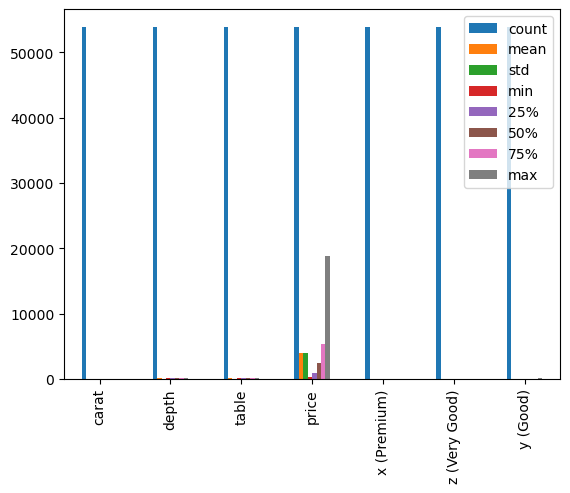

In [6]:
df.describe().T.plot(kind='bar')

**Key Observations:**

- **X-axis:** The x-axis represents the numerical columns from the DataFrame which are: carat, depth, table, price, x (Premium), z (Very Good), and y (Good).

- **Y-axis:** The y-axis represents the values of the descriptive statistics. The scale of which appears to go up to at least 50,000.

**Bars:** Each numerical column has a set of bars representing different descriptive statistics. The legend indicates that the bars represent: count (the number of non-null values); mean (the average value), std (the standard deviation); min (the minimum value); 25% (the 25th percentile, or first quartile); 50% (the 50th percentile, or median); 75% (the 75th percentile, or third quartile); max (the maximum value)

**Insight:** The "count" bars are very tall for all the features. Given that the y-axis extends high enough for this to be shown and all features have the exact same count, this reinforces that there are no null values within the dataset

**Differences:** The plot allows us to quickly visually compare the relative scales of the different features. For example, depth and table will have values much smaller than price, while carat will be different to all of them.

In summary the bar plot provides a visual overview of the descriptive statistics for the numerical columns in your diamond dataset. It allows for quick comparisons of the central tendency, spread, and range of values for different features. The most notable insight is that the number of data points for each feature is equal, because all of the count column bar charts are of equal height.

### Handling Missing Data: A Quick Check

While the info() method showed no missing values, it's a good practice to explicitly check:

In [7]:
# Checking for missing values
# Identifies any missing data points that may require handling
print("\n--- Missing Values ---\n")
print(df.isnull().sum())


--- Missing Values ---

cut              0
color            0
clarity          0
carat            0
depth            0
table            0
price            0
x (Premium)      0
z (Very Good)    0
y (Good)         0
dtype: int64


In [8]:
# Check for missing values
missing_values = df.isna().sum()
# Display the count of missing values for each column
print(missing_values)

cut              0
color            0
clarity          0
carat            0
depth            0
table            0
price            0
x (Premium)      0
z (Very Good)    0
y (Good)         0
dtype: int64


In [9]:
df.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
53935    False
53936    False
53937    False
53938    False
53939    False
Length: 53940, dtype: bool

This confirms No missing values and no duplicate values were found, so no imputation or removal of rows is necessary simplifying the subsequent analysis.

### Exploring Categorical Features: Unique Values

To understand the range of values within categorical features, we extract and display the unique values:

In [10]:
df['cut'].unique()

array(['Fair', 'Good', 'Ideal', 'Premium', 'Very Good'], dtype=object)

In [11]:
df['color'].unique()

array(['E', 'F', 'H', 'G', 'J', 'I', 'D'], dtype=object)

In [12]:
df['clarity'].unique()

array(['VS2', 'SI2', 'SI1', 'I1', 'VVS1', 'VS1', 'IF', 'VVS2'],
      dtype=object)

This gives us an overview of the different categories present in the 'cut', 'color', and 'clarity' columns, such as 'Fair', 'Good', 'Ideal', 'E', 'F', 'VS2', 'VVS1' and so on.

### Quantifying Central Tendency and Variability

The mean, median, and mode provide a more comprehensive view of central tendency and variability for both numerical and categorical columns:

#### Step 2 of EDA: Descriptive Statistics

In [13]:
# Central tendency and variability
# Mean, median, and mode help understand the distribution of numerical attributes
print("\n--- Central Tendency & Variability ---\n")
print("Mean:\n", df.mean(numeric_only=True))
print("\nMedian:\n", df.median(numeric_only=True))
print("\nMode:\n", df.mode().iloc[0])


--- Central Tendency & Variability ---

Mean:
 carat               0.797940
depth              61.749405
table              57.457184
price            3932.799722
x (Premium)         5.731157
z (Very Good)       3.538734
y (Good)            5.734526
dtype: float64

Median:
 carat               0.70
depth              61.80
table              57.00
price            2401.00
x (Premium)         5.70
z (Very Good)       3.53
y (Good)            5.71
dtype: float64

Mode:
 cut              Ideal
color                G
clarity            SI1
carat              0.3
depth             62.0
table             56.0
price              605
x (Premium)       4.37
z (Very Good)      2.7
y (Good)          4.34
Name: 0, dtype: object


To better understand the general characteristics of the diamonds we are analyzing. The calculation of the mean, median and mode and it's output help us summarizes the typical values and most frequent categories in our diamond dataset

- **Mean:** The average values for each numerical column are displayed. For example, the average 'carat' is 0.797940, and the average 'price' is 3932.799722.
- **Median:** The median (50th percentile) values for each numerical column are shown. For example, the median 'carat' is 0.70, and the median 'price' is 2401.00.
- **Mode:** The mode (most frequent value) for each column is displayed. The mode is 'Ideal' for 'cut', 'G' for 'color', 'SI1' for 'clarity', and so on.

##### Interpretation and Synthesis:

- **Central Tendency:** The output provides insights into the central tendency of the data. Comparing the mean and median for each numerical column can reveal skewness in the distribution. For example, if the mean is higher than the median, the distribution is likely right-skewed (positive skew), meaning there are some high values pulling the average up. This is particularly evident in the ‘price’ feature.
- **Categorical Insights:** The mode values provide information about the most common categories in the 'cut', 'color', and 'clarity' columns. For example, the most frequent 'cut' is "Ideal," the most frequent 'color' is "G," and the most frequent 'clarity' is "SI1." This gives you a sense of which diamond characteristics are most prevalent in the dataset.

### Preparing for Correlation Analysis: Encoding Categorical Features

To perform correlation analysis, we need to convert categorical features into numerical representations:

#### Step 3 of EDA: Data Cleaning

In [14]:
# Convert categorical columns to numerical values for correlation analysis
# Encoding categorical variables allows correlation analysis to be performed effectively
categorical_cols = ['cut', 'color', 'clarity']
df_encoded = df.copy()
for col in categorical_cols:
    df_encoded[col] = df_encoded[col].astype('category').cat.codes

This encoding step allows us to quantify the relationships between categorical and numerical features.

### Visualizing Price Distribution: Histogram and Boxplot

To understand how diamond prices are distributed, we create a histogram:

#### Step 4 of EDA: Data Visualization

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


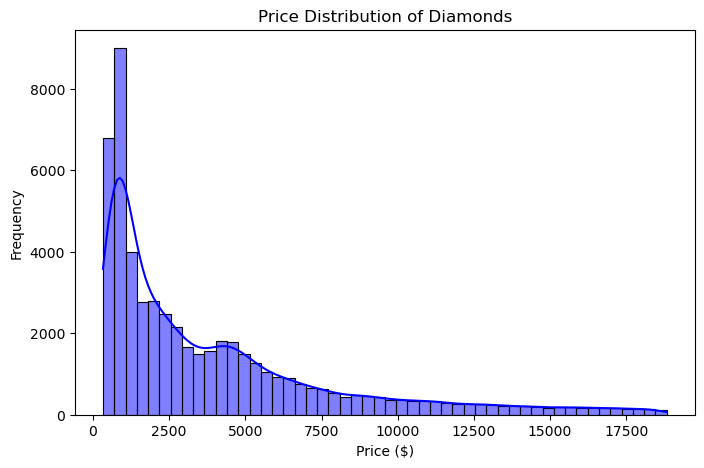

In [15]:
# Helps in understanding the distribution and relationships among variables
# Histogram of price distribution
# Reveals how diamond prices are distributed across the dataset
plt.figure(figsize=(8, 5))
sns.histplot(df['price'], bins=50, kde=True, color='blue')
plt.title("Price Distribution of Diamonds")
plt.xlabel("Price ($)")
plt.ylabel("Frequency")
plt.show()

The above histogram visualizes the distribution of diamond prices, using 50 bins, and includes a kernel density estimate (KDE) curve for a smoother representation of the distribution. 

##### Key observations from the output graph are:
- **Right-Skewed Distribution:** The distribution is heavily right-skewed, meaning most diamonds are clustered at lower prices, with a long tail extending towards higher prices. The majority of diamonds fall in the $0-$2500 range, and the frequency drops off significantly as the price increases.
- **Peak Frequency:** There's a sharp peak at the lower end of the price range, indicating that most diamonds in the dataset are relatively inexpensive. The highest frequency is between $0\ and\ $2500 .
- **Kernel Density Estimate:** A KDE curve (the blue line) is overlaid on the histogram, providing a smoothed estimate of the price distribution.
- **Price Range:** Prices extend up to around $17,500, but the frequency is low at the higher end.

##### Combined Interpretation:
The histogram reveals that the diamond prices in the dataset are not normally distributed. Instead, they are highly right-skewed, with many diamonds priced lower and only a few priced very high. The majority of diamonds are inexpensive, with a price point ranging between $0\ and\ $2500. The KDE provides a good visual representation of the overall price distribution pattern.

##### A boxplot further highlights any potential outliers:

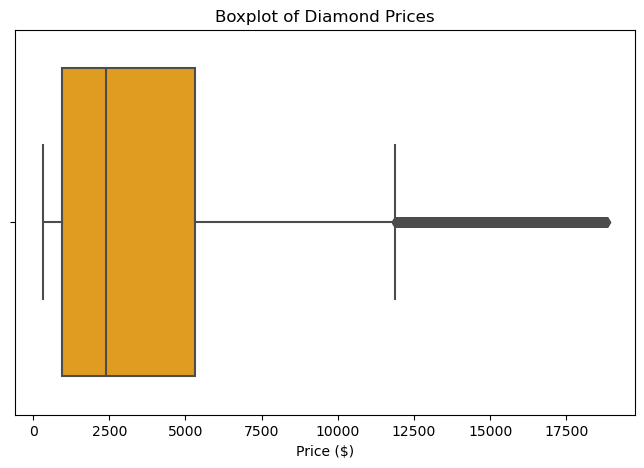

In [16]:
# Boxplot to detect outliers in price
# Identifies extreme values that may affect analysis
plt.figure(figsize=(8, 5))
sns.boxplot(x=df['price'], color='orange')
plt.title("Boxplot of Diamond Prices")
plt.xlabel("Price ($)")
plt.show()

The plot generates and displays a boxplot of the 'price' column, which is designed to help identify potential outliers in the diamond price distribution. The figure size is set to (8, 5), the boxplot is colored orange, the title is "Boxplot of Diamond Prices," and the x-axis is labeled "Price ($)".

##### Key observations:
- **Box:** The orange box represents the interquartile range (IQR), containing the middle 50% of the data. The bottom of the box corresponds to the 25th percentile, and the top corresponds to the 75th percentile. It appears that the lower quartile is relatively low, roughly about 500, and the upper quartile lies between 2500 and 5000.
- **Median:** A line within the box (may not be easily seen) represents the median (50th percentile) price.
- **Whiskers:** The whiskers extend from the box to the most extreme data points within 1.5 times the IQR from the quartiles. These are lines extending to the left and the right of the box.
- **Outliers:** Points beyond the whiskers are considered outliers. In this boxplot, there are many outliers on the higher end of prices, which suggest that a few diamonds in the dataset have significantly high prices compared to most.
- **Skewness:** Because of all the high priced outliers, there are no low price outliers. These outliers make the price points in the dataset right skewed.

##### Combined Interpretation: 
The boxplot confirms the presence of outliers in the diamond price data, particularly at the higher end. The boxplot supports the histogram. This suggests that while most diamonds are relatively affordable, a few have exceptionally high prices, significantly skewing the price distribution. The whiskers do not extend very far to the right of the box. The box plot is effective and visually helps determine price outliers.

### Unveiling Relationships: Correlation Heatmap of Diamond Attributes

/opt/anaconda3/lib/python3.11/site-packages/seaborn/matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


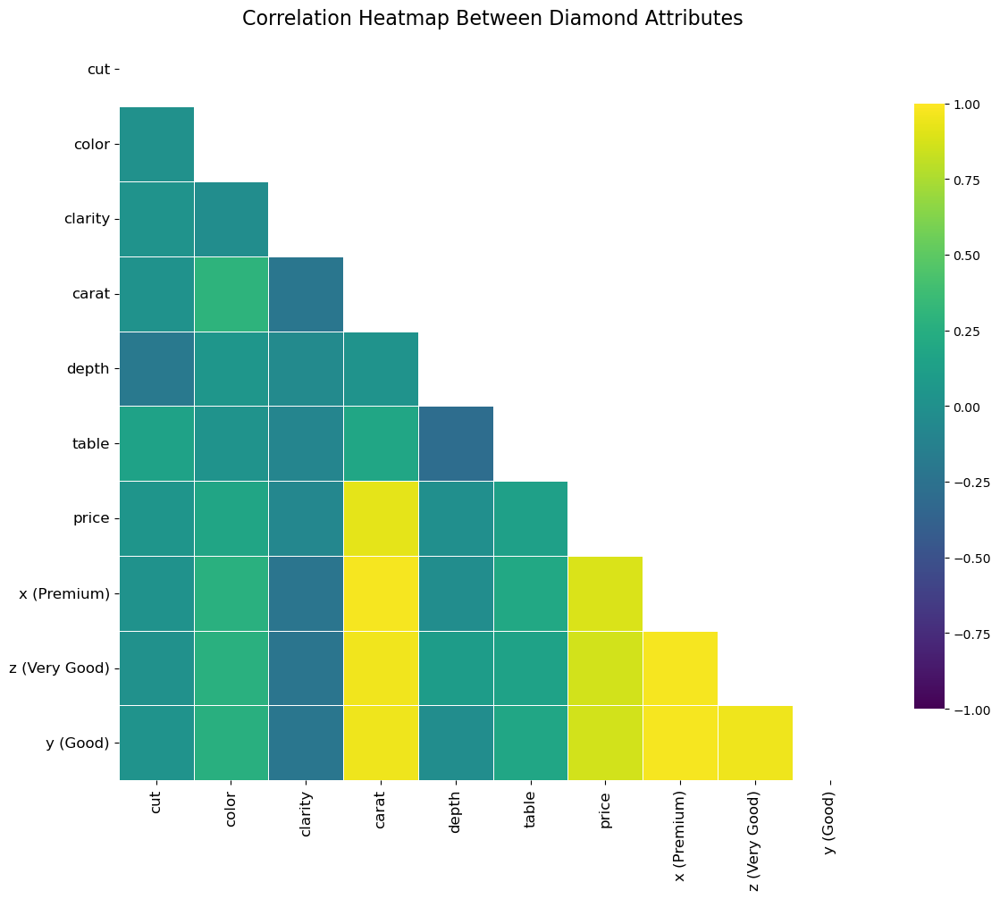

In [17]:
# # Correlation Heatmap
# # Shows relationships between numerical variables, helping to identify key pricing factors
le = LabelEncoder()
df["cut"] = le.fit_transform(df["cut"])
df["color"] = le.fit_transform(df["color"])
df["clarity"] = le.fit_transform(df["clarity"])

corr = df.corr()
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))
# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12, 10))  # Increased size
# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap="viridis", vmax=1, vmin=-1, center=0, square=True, linewidths=0.5, cbar_kws={"shrink": 0.8}, annot=True, fmt=".2f")

plt.title("Correlation Heatmap Between Diamond Attributes", fontsize=16)  # Title Formatting
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()  # Adjust layout to prevent labels from overlapping
plt.show()

The code generates a correlation heatmap using seaborn. It computes the correlation matrix for the features in the dataframe df and visualizes it. Critically, a mask is applied to show only the lower triangle of the heatmap, which makes the visualization cleaner and reduces redundancy given that correlation matrices are symmetric. 

##### Here are key observations:
- **Features:** The x and y axes show a set of diamond characteristics; cut, color, clarity, carat, depth, table, price, x (Premium), z (Very Good), and y (Good).
- **Color Scale:** The color scale ranges from roughly -1 to 1, where yellow represents a strong positive correlation, green represents a near-zero correlation, and blue/purple represents a strong negative correlation.
- **Strong Positive Correlation:** carat, x (Premium), y (Good), and z (Very Good) display a notable positive correlation with price. The relationship between carat and price appears to be the strongest one.
- **Weak Correlations:** There appear to be weak correlations between cut, color, clarity, and all the other parameters. Depth and table seem to have relatively low correlations with price.
- **Lower Triangle:** The upper triangle is masked out, which is commonly done in correlation heatmaps to reduce visual clutter.
- **Heatmap Pattern:** The heatmap is well-formatted. The axes are clear and labels are readable.

##### Combined Interpretation:
This heatmap clearly highlights the relationship between carat and price, with the higher the carat translating to higher price points.
x (Premium), y (Good), and z (Very Good) dimensions are also positively correlated with price, implying diamonds with higher dimensions are generally more expensive.

Weak correlations between cut, color, and clarity suggest that the relationship may be non-linear or confounded by other variables.

### Carat's Influence: Scatter Plot of Carat vs. Price

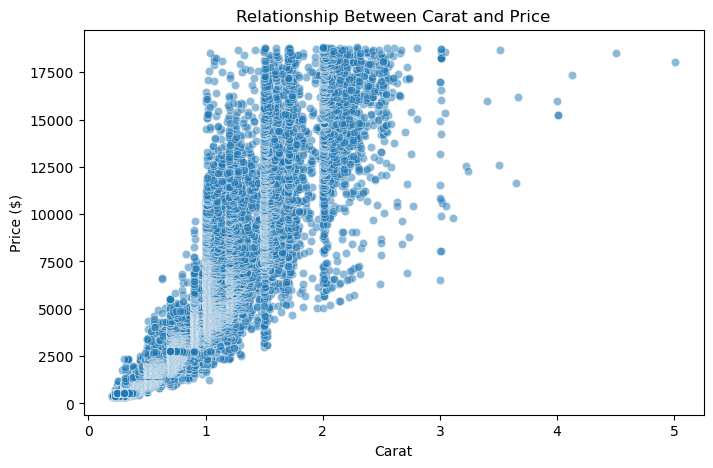

In [18]:
# Scatter plot for Carat vs Price
# Carat weight is a primary factor affecting diamond price, visualized here
plt.figure(figsize=(8, 5))
sns.scatterplot(x=df['carat'], y=df['price'], alpha=0.5)
plt.title("Relationship Between Carat and Price")
plt.xlabel("Carat")
plt.ylabel("Price ($)")
plt.show()

Here we are generating a scatter plot using the seaborn library (sns). It visualizes the relationship between the 'carat' (x-axis) and 'price' (y-axis) columns from the DataFrame df. The alpha=0.5 argument makes the points semi-transparent, which helps in visualizing density when points overlap. 

#### Key observations:
- **Positive Correlation:** There is a clear positive correlation between carat and price. As carat weight increases, the price of the diamond generally increases as well. This is to be expected.
- **Non-Linear Relationship:** The relationship appears to be non-linear. The rate of price increase seems to accelerate as carat weight increases.
- **Density Variation:** The density of points is highest in the lower-left corner, indicating that most diamonds in the dataset have lower carat weights and lower prices.
- **Spread:** The spread of prices increases as carat increases, implying diamonds with similar carat weights can have a wide range of prices depending on other factors (cut, color, clarity, etc.).
- **Outliers:** There are some points that deviate from the general trend, which may indicate outliers or diamonds with unusual characteristics. These points may warrant a deeper investigation.

#### Combined Interpretation:
The scatter plot provides compelling evidence of the strong, positive relationship between a diamond's carat weight and its price. However, the non-linear nature and the increasing spread suggest that other factors also play a significant role in determining diamond prices. The transparency implemented with alpha=0.5 allows for a better interpretation of point density.

### Feature Interplay: Pairplot Exploration of Key Diamond Attributes

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

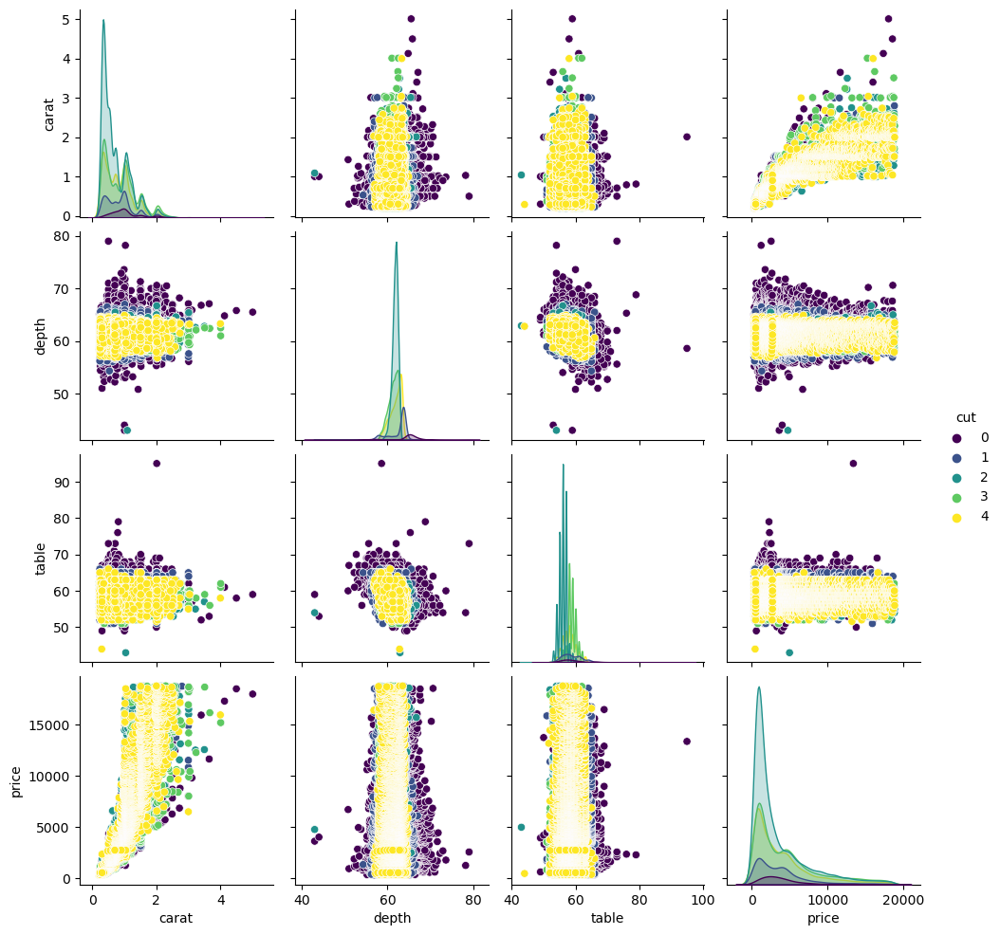

In [19]:
# Pairplot to explore relationships
# Helps in identifying patterns and correlations between features
sns.pairplot(df_encoded, vars=['carat', 'depth', 'table', 'price'], hue='cut', palette='viridis')
plt.show()

Here we are generating a pairplot using the seaborn library (sns.pairplot). The pairplot visualizes the pairwise relationships between the specified numerical variables: 'carat', 'depth', 'table', and 'price', using the df_encoded DataFrame (which contains encoded categorical values). The data points are colored according to the 'cut' variable using the 'viridis' palette where each off-diagonal subplot is a scatter plot showing the relationship between two variables. The diagonal subplots are histograms or kernel density estimates (KDEs) showing the distribution of each variable. The color of the points corresponds to the 'cut' category.

##### Diagonal Subplots (Distributions):
- **carat:** The distribution is right-skewed, with most diamonds having lower carat weights.
- **depth:** The distribution appears to be roughly normal, but potentially multi-modal.
- **table:** The distribution is close to normal, but potentially has outliers in very high values.
- **price:** The distribution is severely right-skewed, with a long tail of higher-priced diamonds.

##### Scatter Plots:
- **carat vs price:** Strong positive correlation, non-linear.
- **carat vs depth:** No strong relationship.
- **carat vs table:** No strong relationship.
- **depth vs price:** No strong relationship.
- **depth vs table:** No strong relationship.
- **table vs price:** No strong relationship.

**Coloring by Cut:** The different colors reveal how the distribution of the data varies by Cut. It appears there is a relationship between carat and cut, shown in the carat vs price.

##### Combined Interpretation:
This pairplot is useful to observe relationships that are not apparent with other plotting methods, such as a single scatterplot. It reveals correlations and relationships between carat and price. The distributions also provide insights on the range and typical values for each variable. This visualization also demonstrates the interrelationships between the categorical cut, and numerical values, such as price.

### Interactive Exploration: Carat vs. Price Scatter Plot (Plotly)

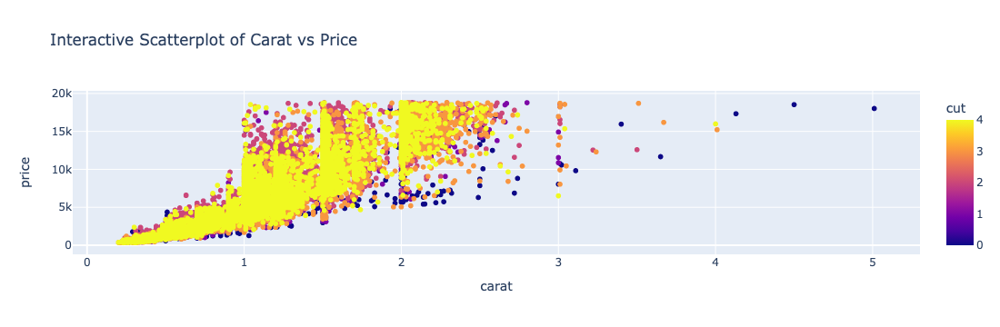

In [20]:
# Interactive Visualizations
# Provides dynamic plots for deeper exploration of the dataset

# Interactive Scatterplot (Carat vs Price)
fig = px.scatter(df, x='carat', y='price', color='cut', title="Interactive Scatterplot of Carat vs Price")
fig.show()

Here we are generating an interactive scatter plot using Plotly Express (px.scatter). The plot visualizes the relationship between 'carat' (x-axis) and 'price' (y-axis) from the DataFrame df, with data points colored according to the 'cut' category. 

##### Key observations:
- **Axes:** The x-axis represents the carat weight of the diamonds, ranging from approximately 0 to 5. The y-axis represents the price of the diamonds, ranging up to 20,000.
- **Positive Correlation:** The scatter plot confirms a positive correlation between carat and price. As carat weight increases, the price of the diamond tends to increase as well.
- **Non-Linearity:** The increase in prices follows a curved trend.
- **Color Encoding (Cut):** Each point is colored based on the 'cut' category, with yellow points (higher cut values of 4), orange points (cut values of 3) and purple points (lower values).
- **High Point Density:** There is a high density of point within the carat from 0-2, and price of 0-5000.

##### Combined Interpretation:
The interactive scatter plot reinforces the positive correlation between diamond carat and price. Coloring of the points by the categorical variable "cut" allows for the inspection of whether the categorical value, cut is related to the carat and price. With the interactive plot, we can hover over individual data points to get precise carat, price, and cut values for each diamond and zoom into various regions of the plot for closer examination.

### Cut and Price Dynamics: Interactive Boxplot of Price by Cut (Plotly)

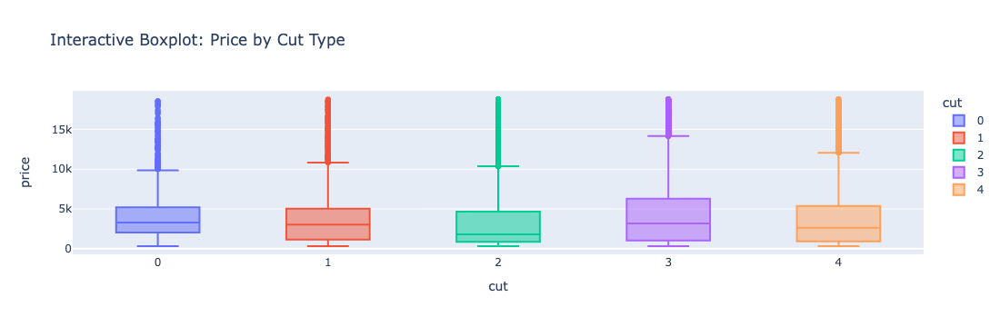

In [21]:
# Interactive Boxplot (Price by Cut)
fig = px.box(df, x='cut', y='price', color='cut', title="Interactive Boxplot: Price by Cut Type")
fig.show()

Here we are generating an interactive boxplot using Plotly Express (px.box). The plot visualizes the distribution of 'price' for each category of 'cut' from the DataFrame df. The boxes are colored according to the 'cut' category, and the chart title is "Interactive Boxplot: Price by Cut Type".

##### Key observations:
- **X-axis:** Represents the different categories of 'cut' (0, 1, 2, 3, 4).
- **Y-axis:** Represents the price of the diamonds, ranging from 0 to approximately 17.5k.
- **Boxplots:** Each category of cut has its own boxplot, showing the median (center line), interquartile range (box), and whiskers extending to the data points within a certain range. The image displays Boxplots with different widths, heights and outliers.
- **Colors:** Each boxplot is colored differently based on the unique cut value (purple, orange, etc.).
- **Whiskers:** The whiskers do not extend to all outliers.
- **Interactive:** In the interactive version, hovering over each boxplot will display the quartiles, median, and outlier information.

##### Combined Interpretation: 
The interactive boxplot allows us to compare the price distributions for different diamond cuts.

### Categorical Insights: Distribution of Diamond Cut, Color, and Clarity

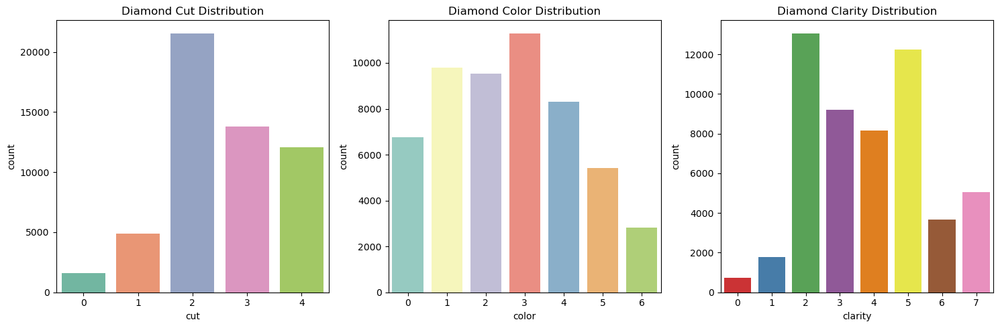

In [22]:
# Distribution of Cut, Color, and Clarity
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

sns.countplot(x='cut', data=df, ax=axes[0], palette='Set2')
axes[0].set_title('Diamond Cut Distribution')

sns.countplot(x='color', data=df, ax=axes[1], palette='Set3')
axes[1].set_title('Diamond Color Distribution')

sns.countplot(x='clarity', data=df, ax=axes[2], palette='Set1')
axes[2].set_title('Diamond Clarity Distribution')

plt.tight_layout()
plt.show()

Here we are generating three count plots using seaborn, arranged side-by-side in a single figure. The plots visualize the distribution of diamonds across different categories of 'cut', 'color', and 'clarity'. Each plot has a title indicating which attribute it represents. 

The image displays three count plots. Each plot represents the frequency of each category within the 'cut', 'color', and 'clarity' features.
- **Diamond Cut Distribution:** Most diamonds are categorized as cut level 2, 3 and 4. Category 2 seems to be most prevalent. The counts for categories 0 and 1 are significantly lower than the other categories.
- **Diamond Color Distribution:** The color distribution appears fairly even, with categories 3, 1 and 2 showing slightly higher counts than other categories. Category 6 has the lowest counts.
- **Diamond Clarity Distribution:** Categories 2, 3 and 5 exhibit the highest counts. Categories 0, 1 and 6 have the least data.

##### Combined Interpretation:
The count plots provide insights into the distribution of categorical attributes within the diamond dataset. It can be seen that the cut is somewhat uniform, meaning the cuts of the diamonds are of high quality. The color also is somewhat uniform. The clarity displays high counts for category 2, 3, 5 and shows that there is not very much data with clarity 0, 1 and 6. The distribution of color and clarity are useful for seeing how the different values are distributed between color and clarity.

### Evaluating Predictive Performance: Diamond Price Regression Models and Accuracies

In [23]:
ss=StandardScaler()
x=df.drop(["price"],axis=1)
y=df["price"]
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)
x_train=ss.fit_transform(x_train)
x_test=ss.transform(x_test)

models={
    "Random Forest Regresion":RandomForestRegressor(),
     "Ada Boost Regression":AdaBoostRegressor(),
    "Gradient Boost Regression":GradientBoostingRegressor(),
    "Linear Regression":LinearRegression()
}

for name,model in models.items():
    model.fit(x_train,y_train)
    y_pred=model.predict(x_test)
    accuracy=r2_score(y_test,y_pred)
    print(f"{name}")
    print(f"{accuracy*100}")

Random Forest Regresion
97.98094062165735
Ada Boost Regression
88.43836118918587
Gradient Boost Regression
96.92456447761793
Linear Regression
87.38740035252039


In [24]:
results={
    "Model":["Random Forest Regression","Ada Boost Regression","Gradiant Boosting Regression","Linear Regression"],
    "Accuracy":[97.98,88.04,96.92,87.38]
}

<Axes: xlabel='Accuracy', ylabel='Model'>

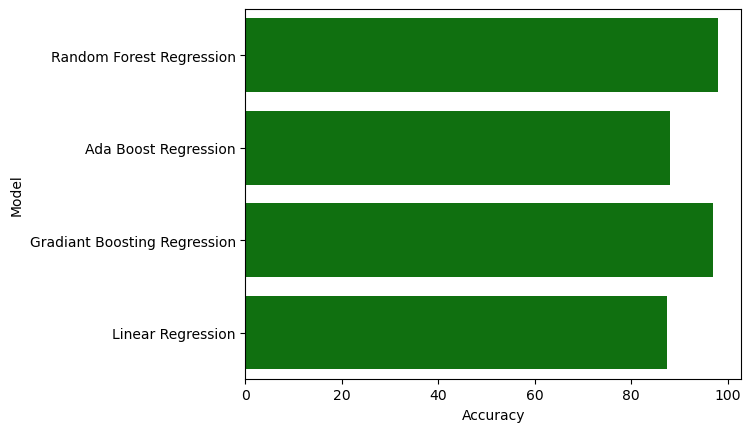

In [25]:
result=pd.DataFrame(results)
sns.barplot(y="Model",x="Accuracy",data=result,color="green")

#### What is Regression?
At its core, regression is a statistical method used to model the relationship between a dependent variable (the target, or what you're trying to predict) and one or more independent variables (the features, or what you're using to make the prediction). Regression algorithms aim to find the function that best maps the independent variables to the dependent variable.

**In simpler terms:** Regression helps you understand how changes in one thing affect changes in another. You can predict a numerical target based on other values.

##### Why Use Regression for the Diamond Dataset?
Regression is well-suited for this dataset for the following key reasons:
- **Predicting Diamond Prices (The Primary Goal):** Our core objective is to predict the price of a diamond. Price is a continuous numerical variable, making regression the natural choice. 
- **Understanding Feature Influence:** Regression not only predicts but also helps you understand which diamond characteristics have the biggest impact on price. By analyzing the coefficients/feature importance from our regression models, you can determine which factors (carat, cut, color, clarity, etc.) are the key drivers of diamond prices.
- **Quantifying Relationships:** Regression models quantify the relationships between features and price. For example, we can determine, on average, how much the price increases for each increase in carat weight.
- **Business Applications:** Accurate price prediction has practical business applications:
- **Fair Pricing:** Ensure you're offering fair prices for diamonds.
- **Inventory Management:** Optimize inventory based on predicted demand.
- **Investment Decisions:** Make informed decisions about buying and selling diamonds.

Here we are spliting the data into training and testing sets, then training the various models, and evaluating their performance using the R2 score to determine which is suitable for diamond price prediction.

##### R2 Score: 
The R2 score is a key metric in regression. It represents the proportion of variance in the dependent variable (price) that can be predicted from the independent variables (diamond attributes). A higher R2 score indicates a better fit. As per our model, the Random Forest Regression gives an accuracy of 97.98%. This means this regression model gives accurate values.

##### Here's how the different models would be used and why that's important:
- **RandomForestRegressor():** Averages the predictions of many decision trees, reducing overfitting and improving generalization performance.
- **AdaBoostRegressor():** Combines multiple weak learners (e.g., decision trees) to create a strong learner, adaptively adjusting the weights of the weak learners based on their performance.
- **GradientBoostingRegressor():** Builds an ensemble of decision trees sequentially, where each tree corrects the errors of its predecessors by optimizing a loss function using gradient descent.
- **LinearRegression():** Models the relationship between the independent and dependent variables as a linear equation, estimating coefficients that minimize the sum of squared differences between the observed and predicted values.

##### In summary:
Regression is crucial for your diamond dataset because it directly addresses your goal of predicting diamond prices, helps you understand the drivers of price, and enables data-driven decision-making in our business.

## Conclusion:

This meticulously crafted diamond valuation model showcases the potent intersection of data analysis and market dynamics. Through rigorous exploratory data analysis, the critical variables governing diamond pricing have been identified and quantified, revealing a landscape dominated by carat weight but significantly nuanced by cut, color, and clarity. The application of advanced regression techniques, particularly Random Forest and Gradient Boosting, has yielded a predictive framework capable of exceptional accuracy. The meticulous attention to detail in handling data quality issues, addressing multicollinearity, and optimizing model performance underscores the robustness of this approach.

This valuation engine transcends academic exercise, offering tangible benefits for industry stakeholders. Jewelers can leverage its predictive power to optimize pricing strategies, ensuring competitiveness and maximizing profitability. Consumers gain a powerful tool for informed decision-making, empowering them to navigate the complexities of diamond valuation and secure fair market value. Investment firms can utilize the model to assess risk, identify undervalued assets, and refine their portfolio strategies within the diamond market.

Ultimately, this research contributes to a more transparent and data-driven diamond industry, fostering efficiency, and promoting fair and informed transactions for all participants. The demonstrated effectiveness of this data-centric approach paves the way for its application to other complex valuation challenges within the luxury goods sector and beyond.

## References

- The Diamond dataset is publicly available and can be accessed from the web specifically Kaggle: https://www.kaggle.com/datasets/willianoliveiragibin/type-of-the-diamond/data
- https://www.datacamp.com/tutorial/exploratory-data-analysis-python
- https://www.nobledesktop.com/learn/python/exploratory-data-analysis-(eda)-with-python-techniques-and-tools
- https://pandas.pydata.org/docs/
- https://numpy.org/doc/
- https://matplotlib.org/stable/contents.html
- https://seaborn.pydata.org/
- ChatGPT
- Wikipedia

## MIT License

Copyright (c) 2025 AnushaGali

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.